Permalink:
https://colab.research.google.com/drive/1gfRZXZZzWOqyHxysv7Pmbx4X87-GDyrt?usp=sharing

In [1]:
import numpy as np
import cv2
from skimage import io
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow

!wget 'http://cvlab.hanyang.ac.kr/tracker_benchmark/seq/Toy.zip'

--2020-10-20 06:16:22--  http://cvlab.hanyang.ac.kr/tracker_benchmark/seq/Toy.zip
Resolving cvlab.hanyang.ac.kr (cvlab.hanyang.ac.kr)... 166.104.143.24
Connecting to cvlab.hanyang.ac.kr (cvlab.hanyang.ac.kr)|166.104.143.24|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4601902 (4.4M) [application/zip]
Saving to: ‘Toy.zip’

Toy.zip             100%[===================>]   4.39M   482KB/s    in 11s     

2020-10-20 06:16:35 (422 KB/s) - ‘Toy.zip’ saved [4601902/4601902]



In [2]:
!unzip -oq Toy.zip

In [ ]:
!ls './Toy/img/'

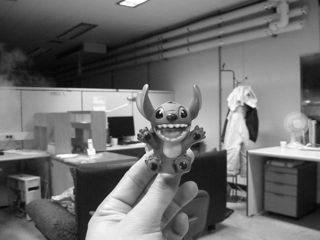

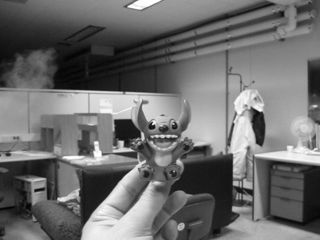

In [170]:
img1_path = './Toy/img/0001.jpg'
img2_path = './Toy/img/0010.jpg'
#img1_path = './test1.jpg'
#img2_path = './test2.jpg'
#img1 = cv2.imread('./Toy/img/0001.jpg',0)
img1 = cv2.imread(img1_path,0)
img2 = cv2.imread(img2_path,0)
#cv2.imshow('image1',img1)
cv2_imshow(img1)
cv2_imshow(img2)

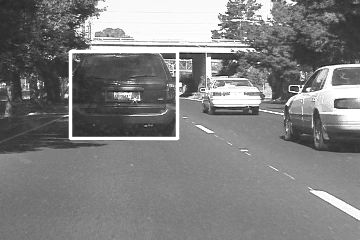

In [190]:
img1_path = './Car4/img/0001.jpg'
img2_path = './Car4/img/0010.jpg'
#img1_path = './test1.jpg'
#img2_path = './test2.jpg'
#img1 = cv2.imread('./Toy/img/0001.jpg',0)
img1 = cv2.imread(img1_path,0)
img2 = cv2.imread(img2_path,0)
#cv2.imshow('image1',img1)
#70	51	107	87
img1_c = img1.copy()

img1_c = cv2.rectangle(img1_c, (70,51), (177, 138), 255, 2, cv2.LINE_AA)


cv2_imshow(img1_c)


In [191]:
(70+107, 51 + 87)

(177, 138)

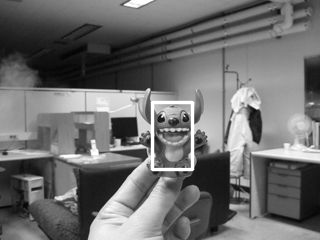

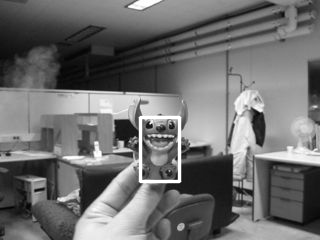

In [ ]:
img1_c = img1.copy()
img2_c = img2.copy()
img1_c = cv2.rectangle(img1_c, (152,102), (152 + 40, 102 + 67), 255, 2, cv2.LINE_AA)
img2_c = cv2.rectangle(img2_c, (140,	117), (140 + 39,	117 + 64), 255, 2, cv2.LINE_AA)
#img1_c = cv2.rectangle(img1_c, (70,120), (215, 340), 100, 2, cv2.LINE_AA)
#img2_c = cv2.rectangle(img2_c, (140,	117), (140 + 39,	117 + 64), 255, 2, cv2.LINE_AA)
#140	117	39	64
cv2_imshow(img1_c)
cv2_imshow(img2_c)

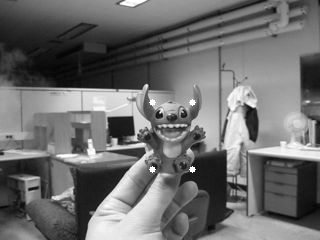

In [ ]:
img_t = img1.copy()
roi = (152, 102, 192, 169)
roi_corners = [(152, 102), (152+40, 102), (152 + 40, 102 + 67), (152, 102 + 67)]
roi_corners
cv2.circle(img_t, roi_corners[0], 3, 255, -1)
cv2.circle(img_t, roi_corners[1], 3, 255, -1)
cv2.circle(img_t, roi_corners[2], 3, 255, -1)
cv2.circle(img_t, roi_corners[3], 3, 255, -1)
cv2_imshow(img_t)

In [118]:
y_shape, x_shape = 40, 60 


def jacobian_slow(x_shape, y_shape):
    # get jacobian of the template size.
    '''
    x = np.array(range(x_shape))
    y = np.array(range(y_shape))
    x, y = np.meshgrid(x, y) 
    ones = np.ones((y_shape, x_shape))
    zeros = np.zeros((y_shape, x_shape))

    row1 = np.stack((x, zeros, y, zeros, ones, zeros), axis=2)
    row2 = np.stack((zeros, x, zeros, y, zeros, ones), axis=2)
    jacob = np.stack((row1, row2), axis=2)
    '''
    jacobian_template = np.zeros((2,6))
    jacobian_template[0,4] = 1.0
    jacobian_template[1,5] = 1.0

    jacob = np.zeros((y_shape, x_shape, 2, 6))
    for y in range(y_shape):
        for x in range(x_shape):
            jcell = jacobian_template.copy()
            jcell[0,0],  jcell[0,2], jcell[1,1], jcell[1,3] = x,y,x,y
            jacob[y,x] = jcell

    return jacob


def jacobian_2dof(x_shape, y_shape):
    scale_favor = 0.1
    # get jacobian of the template size.
    '''
    x = np.array(range(x_shape))
    y = np.array(range(y_shape))
    x, y = np.meshgrid(x, y) 
    ones = np.ones((y_shape, x_shape))
    zeros = np.zeros((y_shape, x_shape))

    row1 = np.stack((x, zeros, y, zeros, ones, zeros), axis=2)
    row2 = np.stack((zeros, x, zeros, y, zeros, ones), axis=2)
    jacob = np.stack((row1, row2), axis=2)
    '''
    jacobian_template = np.zeros((2,6))
    jacobian_template[0,4] = 1.0
    jacobian_template[1,5] = 1.0
    jacobian_template[0,4] = 1.0
    jacobian_template[1,5] = 1.0    

    jacob = np.zeros((y_shape, x_shape, 2, 6))
    for y in range(y_shape):
        for x in range(x_shape):
            jcell = jacobian_template.copy()
            jcell[0,0],  jcell[0,2], jcell[1,1], jcell[1,3] = 1,1,1,1 #x*scale_favor,y*scale_favor,x*scale_favor,y*scale_favor
            jacob[y,x] = jcell

    return jacob   


def jacobian_2dof_simple(x_shape, y_shape):
    #scale_favor = 0.1
    jacobian_template = np.array([
                                 [1,0,1,0,1,0],
                                 [0,1,0,1,0,1]
    ])

    jacob = np.zeros((y_shape, x_shape, 2, 6))
    jacob[:,:] = jacobian_template

    return jacob  

def jacobian_simplified(x_shape, y_shape):
    jacob = np.zeros((y_shape, x_shape, 2, 6))
    jacob[:,:, 0, 0] = 1
    jacob[:,:, 0, 2] = 1
    jacob[:,:, 0, 4] = 1
    jacob[:,:, 1, 1] = 1
    jacob[:,:, 1, 3] = 1
    jacob[:,:, 1, 5] = 1
    return jacob 


def jacobian_range(x_min, x_max, y_min, y_max):
    # get jacobian of the template size.
    x = np.array(range(x_min, x_max))
    y = np.array(range(y_min, y_max))
    x_shape = x.shape[0]
    y_shape = y.shape[0]

    x, y = np.meshgrid(x, y) 
    ones = np.ones((y_shape, x_shape))
    zeros = np.zeros((y_shape, x_shape))

    row1 = np.stack((x, zeros, y, zeros, ones, zeros), axis=2)
    row2 = np.stack((zeros, x, zeros, y, zeros, ones), axis=2)
    jacob = np.stack((row1, row2), axis=2) 

    #jacob[:,:, 0, 4] = 1
    #jacob[:,:, 1, 5] = 1
    return jacob    

jacob_slow = jacobian_slow(x_shape, y_shape)   
jacob_fast= jacobian(x_shape, y_shape)
jacob_2df = jacobian_2dof(x_shape, y_shape)
jacob_2df2 = jacobian_2dof_simple(x_shape, y_shape)
jacob_s = jacobian_simplified(x_shape, y_shape)

jacob_ad = jacobian_range(-20, 20, -40, 40)


print(jacob_slow[20, 39])
print(jacob_fast[20, 39])
print(jacob_2df[20, 39])
print(jacob_2df2[20, 39])
print(jacob_s[20, 39])
print(jacob_ad[20,20])

[[39.  0. 20.  0.  1.  0.]
 [ 0. 39.  0. 20.  0.  1.]]
[[39.  0. 20.  0.  1.  0.]
 [ 0. 39.  0. 20.  0.  1.]]
[[1. 0. 1. 0. 1. 0.]
 [0. 1. 0. 1. 0. 1.]]
[[1. 0. 1. 0. 1. 0.]
 [0. 1. 0. 1. 0. 1.]]
[[1. 0. 1. 0. 1. 0.]
 [0. 1. 0. 1. 0. 1.]]
[[  0.   0. -20.   0.   1.   0.]
 [  0.   0.   0. -20.   0.   1.]]


roi
[[152 102]
 [192 169]]
clip_region
[[139  80]
 [205 191]]


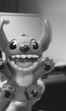

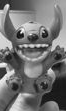

start_x, start_y(139, 80)
p:
[ 1.42397552e+00 -1.94715549e-02  1.85221996e-01  8.09110162e-01
 -2.57190944e+01  7.82378518e+00]
warp_mat
[[ 1.42397552e+00  1.85221996e-01 -2.57190944e+01]
 [-1.94715549e-02  8.09110162e-01  7.82378518e+00]]
warp_mat_inv
[[ 7.00067855e-01 -1.60259964e-01  1.92589508e+01]
 [ 1.68474088e-02  1.23206893e+00 -9.20614253e+00]]
warped_points_ad.T
[[-25 -26]
 [ 11 -26]
 [  9  35]
 [-27  35]]
restored_points
[[153 106]
 [191 106]
 [191 170]
 [153 170]]
roi
[[153 106]
 [191 170]]
Template small


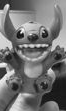

New image no change


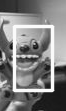

New image  affected by warp function


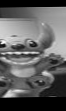

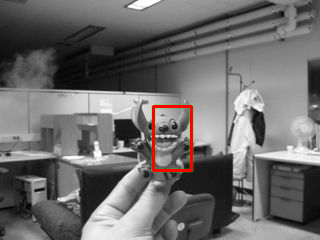

In [172]:
# function to get all four points
def roi_points(roi):
  tl = np.array([roi[0,0], roi[0,1], 1], np.int)
  tr = np.array([roi[1,0], roi[0,1], 1], np.int)
  br = np.array([roi[1,0], roi[1,1], 1], np.int)
  bl = np.array([roi[0,0], roi[1,1], 1], np.int)
  return tl, tr, br, bl

 
'''
# calculating rectagle from four points
def get_rect(tl, tr, br, bl):
  tl, tr, br, bl = 
  tl_x = min(tl[0], tr[0], br[0], bl[0])
  tl_y = min(tl[1], tr[1], br[1], bl[1])
  br_x = max(tl[0], tr[0], br[0], bl[0])
  br_y = max(tl[1], tr[1], br[1], bl[1])
  return np.array([[tl_x, tl_y], [br_x, br_y]], np.int)
'''
def get_rect(points):  
  tl_x = min(points[:,0])
  tl_y = min(points[:,1])
  br_x = max(points[:,0])
  br_y = max(points[:,1])
  return np.array([[tl_x, tl_y], [br_x, br_y]], np.int)

# function to get all four points
def rect_corners(rect):
  assert roi.shape[0] == 2, "There should be two points only" 
  arr =  np.array([[rect[0,0], rect[0,1]],
                   [rect[1,0], rect[0,1]],
                   [rect[1,0], rect[1,1]],
                   [rect[0,0], rect[1,1]]], np.int)
  return arr  

# addint one to the point vector for using in the affine matrix multiplication  
def pad_one(point):
  return np.array([point[0], point[1], 1], np.int)


# function to translate coordinates from the initial image range to the smaller 
# region (assuming the first entry in the bigger_rectangle is a starting point
# either it's 2-point array or 4-point)
# this is roi box with respect to clipped image coordinates
def translate_cordinates(smaller_rectangle, start_x, start_y, reverse = False):
  arr = np.zeros_like(smaller_rectangle)
  direction = -1 if reverse else 1
  #start_x, start_y = bigger_rectangle[0][0], bigger_rectangle[0][1]
  arr[:,0] = smaller_rectangle[:,0] - start_x * direction
  arr[:,1] = smaller_rectangle[:,1] - start_y * direction
  return arr

# function producing the coordinates of area around roi
def clipping_region(roi, img_height, img_width, pad_factor):
  bb_width = roi[1][0] - roi[0][0]
  bb_height = roi[1][1] - roi[0][1]
  roi_clip_tx = max(0, roi[0][0] - int (bb_width * 0.33))
  roi_clip_ty = max(0, roi[0][1] - int (bb_height * 0.33)) 
  roi_clip_bx = min(img_width, roi[1,0] + int (bb_width * 0.33))
  roi_clip_by = min(img_height, roi[1,1] + int (bb_height * 0.33)) 

  roi_clip = np.array([[roi_clip_tx, roi_clip_ty], [roi_clip_bx, roi_clip_by]], np.int)
  return roi_clip

# function adding ones to existing coordinates in order to prepare 
# for multiplication with affine transformation matrix
def expand_with_ones(points):
  ones_arr = np.ones((points.shape[0], 1), np.int)
  prep = np.hstack((points, ones_arr))
  return prep

# not used in favor of jacobian_2dof version
def jacobian(x_shape, y_shape):
    # get jacobian of the template size.
    x = np.array(range(x_shape))
    y = np.array(range(y_shape))
    x, y = np.meshgrid(x, y) 
    ones = np.ones((y_shape, x_shape))
    zeros = np.zeros((y_shape, x_shape))

    row1 = np.stack((x, zeros, y, zeros, ones, zeros), axis=2)
    row2 = np.stack((zeros, x, zeros, y, zeros, ones), axis=2)
    jacob = np.stack((row1, row2), axis=2) 

    jacob[:,:, 0, 4] = 1
    jacob[:,:, 1, 5] = 1
    return jacob

def jacobian_range(x_min, x_max, y_min, y_max):
    # get jacobian of the template size.
    x = np.array(range(x_min, x_max))
    y = np.array(range(y_min, y_max))
    x_shape = x.shape[0]
    y_shape = y.shape[0]

    x, y = np.meshgrid(x, y) 
    ones = np.ones((y_shape, x_shape))
    zeros = np.zeros((y_shape, x_shape))

    row1 = np.stack((x, zeros, y, zeros, ones, zeros), axis=2)
    row2 = np.stack((zeros, x, zeros, y, zeros, ones), axis=2)
    jacob = np.stack((row1, row2), axis=2) 
    jacob[:,:, 0, 4] = 1
    jacob[:,:, 1, 5] = 1

    return jacob    


# modified jacobian matrix favoring translation over 2 dof (x and y offset)
# giving less weight to scaling/rotation
# [1, 0, 1, 0, 1, 0
#  0, 1, 0, 1, 0, 1]  instead 
def jacobian_2dof(x_shape, y_shape):
    #scale_favor = 0.1

    jacobian_template = np.zeros((2,6))
    jacobian_template[0,4] = 1.0
    jacobian_template[1,5] = 1.0

    jacob = np.zeros((y_shape, x_shape, 2, 6))
    for y in range(y_shape):
        for x in range(x_shape):
            jcell = jacobian_template.copy()
            jcell[0,0],  jcell[0,2], jcell[1,1], jcell[1,3] = 1,1,1,1 #x*scale_favor,y*scale_favor,x*scale_favor,y*scale_favor
            jacob[y,x] = jcell

    return jacob 

def jacobian_simplified(x_shape, y_shape):
    jacob = np.zeros((y_shape, x_shape, 2, 6))
    jacob[:,:, 0, 0] = .01
    jacob[:,:, 0, 2] = .01
    jacob[:,:, 0, 4] = 1
    jacob[:,:, 1, 1] = .01 
    jacob[:,:, 1, 3] = .01
    jacob[:,:, 1, 5] = 1
    return jacob    

def draw_rect(image,pts):
    cv2.polylines(image,  [pts.reshape((-1, 1, 2))],  True,  (0, 0, 254),  2)   
    return image

def crop(img, roi):
    return img[roi[0][1]:roi[1][1], roi[0][0]:roi[1][0]]

def lk_track(img, template, rect, p, threshold = 0.001, max_iter=100):
  #print(rect) 
  #img = img.copy()
  #template = template.copy()
  KERNEL_SIZE = 3
  d_p_norm = np.inf
  template = crop(template, rect)
  rows_target, cols_target = template.shape
  rows, cols = img.shape
  p_prev = p
  iter = 0
  
  # some normalizaton required to decrease grad values growing with kernel size
  grad_x = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=KERNEL_SIZE)  / KERNEL_SIZE
  grad_y = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=KERNEL_SIZE)  / KERNEL_SIZE

  while (d_p_norm >= threshold) and iter <= max_iter:
      warp_mat = np.array([[p_prev[0], p_prev[2], p_prev[4]], [p_prev[1], p_prev[3], p_prev[5]]])
      
      #warp_img =  np.round(customWarp(img, wrp_mat))   
      warp_img = cv2.warpAffine(img, warp_mat, (img.shape[1],img.shape[0]),flags=cv2.INTER_CUBIC)
      warp_img = crop(warp_img, rect)
      diff = template.astype(int) - warp_img.astype(int)
      #print(f"diff.shape {diff.shape}")
      #print(f"diff[15, 20] {diff[15, 20]}")
                  
      # Calculate warp gradient of image
      
      #warp the gradient  
      grad_x_warp = crop(cv2.warpAffine(grad_x, warp_mat, (img.shape[1],img.shape[0]),flags=cv2.INTER_CUBIC), rect)
      grad_y_warp = crop(cv2.warpAffine(grad_y, warp_mat, (img.shape[1],img.shape[0]),flags=cv2.INTER_CUBIC), rect)  
      
      #grad_x_warp = crop(customWarp(grad_x, warp_mat), rect)
      #grad_y_warp = crop(customWarp(grad_y, warp_mat), rect)

      #print(f"grad_x_warp[40,20] {grad_x_warp[40,20]}")
      #plt.imshow(grad_x_warp)
      #plt.show()  

      # Calculate Jacobian 
      #jacob = crop(jacobian_simplified(cols, rows), rect)  
      jacob = crop(jacobian(cols, rows), rect)
      #jacob = crop(jacobian_range(-cols//2, cols-cols//2, -rows//2, rows-rows//2), rect)  
      #print(f"jacob shape {jacob.shape}")

      grad = np.stack((grad_x_warp, grad_y_warp), axis=2)
      grad = np.expand_dims((grad), axis=2)
       
      #calculate steepest descent
      steepest_descents = np.matmul(grad, jacob)
      steepest_descents_trans = np.transpose(steepest_descents, (0, 1, 3, 2))
      
      '''
      steepest_descents = np.zeros((rows_target, cols_target, 1, 6))
      for r in range(rows_target):
        for c in range(cols_target):
          steepest_descents[r, c, 0] = grad[r,c,0] @ jacob[r,c]
       
      steepest_descents_trans = np.transpose(steepest_descents, (0, 1, 3, 2))
      '''

      # Compute Hessian matrix
      hessian_matrix = np.matmul(steepest_descents_trans, steepest_descents).sum((0,1))
      #hessian_matrix_prime = np.matmul(steepest_descents_trans, steepest_descents)
      
      #print(f"diff.shape {diff.shape}")
      # Compute steepest-gradient-descent update
      diff = diff.reshape((rows_target, cols_target, 1, 1))
      update = (steepest_descents_trans * diff).sum((0,1))

      # calculate dp and update it
      d_p = np.matmul(np.linalg.pinv(hessian_matrix), update).reshape((-1))
                    
      p_prev -= d_p
      #print(f"d_p {d_p}")
                
      d_p_norm = np.linalg.norm(d_p)
      iter += 1  
  return p_prev


def lk_wrapper(img, template, roi, roi_points):
     # this is padding area around roi
     pad_factor = 0.33

     #initial warp (no transformation = identity)
     p = [1.0, 0 , 0, 1, 0, 0]

     # We need to downsize/crop the image in order to decrease computations for
     # back warping and move reference point closer to original bounding box.
     # This should simplify transformation, rotation in particular 
     # (because it's hardly possible to rotate image with reference point 
     # at the top left corner)
     # We assume that tracked object didn't move further than 1/3 from original bounding box position
     # so let's define new clipping region 1/3 larger than roi
     clip_region = clipping_region(roi, template.shape[0], \
                                   template.shape[1], pad_factor)
     
     # obtaining smaller region instead of full size image 
     clipped_img = crop(img, clip_region).copy()
     templ = crop(template, clip_region).copy()
     start_x, start_y = clip_region[0][0], clip_region[0][1]

     # retriving roi coordinates with respect
     translated_roi = translate_cordinates(roi, start_x, start_y)
     translated_roi_corners =  translate_cordinates(roi_points, start_x, start_y)
     
     p = lk_track(clipped_img, templ, translated_roi,  p)

     warp_mat = np.array([[p[0], p[2], p[4]], [p[1], p[3], p[5]]])
     warp_mat_inv = cv2.invertAffineTransform(warp_mat)
     prepared_points = expand_with_ones(translated_roi_corners)
     warped_points = (warp_mat_inv @ prepared_points.T).astype(int)     
     trans_rect = get_rect(warped_points.T)
     restored_points = translate_cordinates(warped_points.T, start_x, start_y, reverse=True)
     new_roi_rect = get_rect(restored_points)

     return new_roi_rect, restored_points 



# initial bounding box
roi = np.array([[152, 102], [192, 169]], np.int)

# getting all four corners of the box (into a tubple roi_points)
#roi_points = roi_points(roi)
#roi = [[70, 120], [215, 340]]


#initial warp (no transformation = identity)
p = [1.0, 0 , 0, 1, 0, 0]

templ_full_size = img1.copy()
new_image_full_size = img2.copy()


# We need to downsize/crop the image in order to decrease computations for
# back warping and move reference point closer to original bounding box.
# This should simplify transformation, rotation in particular 
# (because it's hardly possible to rotate image with reference point 
# at the top left corner)
# We assume that tracked object didn't move further than 1/3 from original bounding box position
# so let's define new clipping region 1/3 larger than roi

clip_region = clipping_region(roi, templ_full_size.shape[0], templ_full_size.shape[1], 0.33)

clipped_img = crop(new_image_full_size, clip_region)
templ = crop(templ_full_size, clip_region)
print(f"roi\n{roi}")
print(f"clip_region\n{clip_region}")
cv2_imshow(clipped_img)
cv2_imshow(templ)

#clipped_height, clipped_width = clipped_img.shape
start_x, start_y = clip_region[0][0], clip_region[0][1]
print(f"start_x, start_y{start_x, start_y}")
translated_roi = translate_cordinates(roi, start_x, start_y)
translated_roi_corners =  rect_corners(translated_roi)

#translated_roi_corners_ad = translate_cordinates(translated_roi_corners, clipped_width//2, clipped_height//2)

#print(f"cropped image shape {templ.shape}")
#p = lk_track(clipped_img, templ, roi,  p)
p = lk_track(clipped_img, templ, translated_roi,  p)

print(f"p:\n{p}")


warp_mat = np.array([[p[0], p[2], p[4]], [p[1], p[3], p[5]]])
warp_mat_inv = cv2.invertAffineTransform(warp_mat)
print(f"warp_mat\n{warp_mat}")
print(f"warp_mat_inv\n{warp_mat_inv}")

prepared_points = expand_with_ones(translated_roi_corners)
#prepared_points_ad = expand_with_ones(translated_roi_corners_ad)
warped_points = (warp_mat_inv @ prepared_points.T).astype(int)
#warped_points_ad = (warp_mat_inv @ prepared_points_ad.T).astype(int)

#warped_points_restored = translate_cordinates(warped_points_ad, clipped_width//2, clipped_height//2)
#print(f"warped_points.T\n{warped_points.T}")
print(f"warped_points_ad.T\n{warped_points_ad.T}")
#rans_rect = get_rect(warped_points.T)
#print(f"trans_rect\n{trans_rect}")

#restored_points = translate_cordinates(warped_points.T, start_x, start_y, reverse=True)
#restored_points = get_rect(warped_points_restored)
print(f"restored_points\n{restored_points}")
roi = get_rect(restored_points)
print(f"roi\n{roi}")



new_clipped_image = cv2.rectangle(clipped_img.copy(), tuple(trans_rect[0]), tuple(trans_rect[1]), 250, 2, cv2.LINE_AA)
final_image = cv2.cvtColor(new_image_full_size, cv2.COLOR_GRAY2BGR)
final_image = cv2.rectangle(final_image.copy(), tuple(roi[0]), tuple(roi[1]), (0,250, 0), 2, cv2.LINE_AA)
final_image = draw_rect(final_image, restored_points)

warp_clipped_img = cv2.warpAffine(clipped_img, warp_mat, (clipped_img.shape[1],clipped_img.shape[0]),flags=cv2.INTER_CUBIC)
#warp_clipped_img = customWarp(clipped_img, warp_mat)
#140	117	39	64


#cv2_imshow(img1.copy())
#cv2_imshow(img2.copy())
print('Template small')
#cv2_imshow(templ_initial)
cv2_imshow(templ)
print('New image no change')
#cv2_imshow(new_image_initial)
cv2_imshow(new_clipped_image)
print('New image  affected by warp function')
cv2_imshow(warp_clipped_img)

cv2_imshow(final_image)


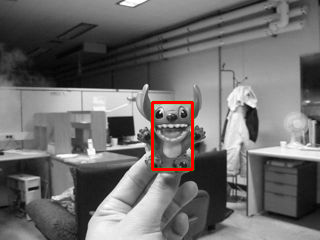

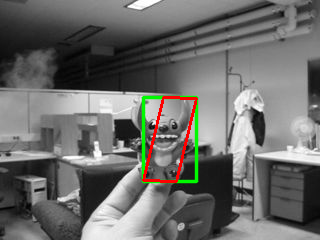

In [182]:
def lk_wrapper(img, template, roi, roi_points):
     # this is padding area around roi
     pad_factor = 0.33

     #initial warp (no transformation = identity)
     p = [1.0, 0 , 0, 1, 0, 0]

     # We need to downsize/crop the image in order to decrease computations for
     # back warping and move reference point closer to original bounding box.
     # This should simplify transformation, rotation in particular 
     # (because it's hardly possible to rotate image with reference point 
     # at the top left corner)
     # We assume that tracked object didn't move further than 1/3 from original bounding box position
     # so let's define new clipping region 1/3 larger than roi
     clip_region = clipping_region(roi, template.shape[0], \
                                   template.shape[1], pad_factor)
     
     # obtaining smaller region instead of full size image 
     clipped_img = crop(img, clip_region).copy()
     templ = crop(template, clip_region).copy()
     start_x, start_y = clip_region[0][0], clip_region[0][1]

     # retriving roi coordinates with respect
     translated_roi = translate_cordinates(roi, start_x, start_y)
     translated_roi_corners =  translate_cordinates(roi_points, start_x, start_y)
     
     p = lk_track(clipped_img, templ, translated_roi,  p)

     warp_mat = np.array([[p[0], p[2], p[4]], [p[1], p[3], p[5]]])
     warp_mat_inv = cv2.invertAffineTransform(warp_mat)
     prepared_points = expand_with_ones(translated_roi_corners)
     warped_points = (warp_mat_inv @ prepared_points.T).astype(int)     
     trans_rect = get_rect(warped_points.T)
     restored_points = translate_cordinates(warped_points.T, start_x, start_y, reverse=True)
     new_roi_rect = get_rect(restored_points)

     return new_roi_rect, restored_points 


def lk_track_v2(img, template, rect, p, threshold = 0.001, max_iter=100):
  #print(rect) 
  #img = img.copy()
  #template = template.copy()
  KERNEL_SIZE = 3
  d_p_norm = np.inf
  template = crop(template, rect)
  rows_target, cols_target = template.shape
  rows, cols = img.shape
  p_prev = p
  iter = 0
  
  # some normalizaton required to decrease grad values growing with kernel size
  grad_x = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=KERNEL_SIZE)  / KERNEL_SIZE
  grad_y = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=KERNEL_SIZE)  / KERNEL_SIZE

  while (d_p_norm >= threshold) and iter <= max_iter:
      warp_mat = np.array([[p_prev[0], p_prev[2], p_prev[4]], [p_prev[1], p_prev[3], p_prev[5]]])
      
      warp_img =  np.round(customWarp(img, warp_mat))   
      #warp_img = cv2.warpAffine(img, warp_mat, (img.shape[1],img.shape[0]),flags=cv2.INTER_CUBIC)
      warp_img = crop(warp_img, rect)
      diff = template.astype(int) - warp_img.astype(int)
      #print(f"diff.shape {diff.shape}")
      #print(f"diff[15, 20] {diff[15, 20]}")
                  
      # Calculate warp gradient of image
      
      #warp the gradient  
      #grad_x_warp = crop(cv2.warpAffine(grad_x, warp_mat, (img.shape[1],img.shape[0]),flags=cv2.INTER_CUBIC), rect)
      #grad_y_warp = crop(cv2.warpAffine(grad_y, warp_mat, (img.shape[1],img.shape[0]),flags=cv2.INTER_CUBIC), rect)  
      
      grad_x_warp = crop(customWarp(grad_x, warp_mat), rect)
      grad_y_warp = crop(customWarp(grad_y, warp_mat), rect)

      #print(f"grad_x_warp[40,20] {grad_x_warp[40,20]}")
      #plt.imshow(grad_x_warp)
      #plt.show()  

      # Calculate Jacobian 
      #jacob = crop(jacobian_simplified(cols, rows), rect)  
      #jacob = crop(jacobian(cols, rows), rect)
      jacob = crop(jacobian_range(-cols//2, cols-cols//2, -rows//2, rows-rows//2), rect)  
      #print(f"jacob shape {jacob.shape}")

      grad = np.stack((grad_x_warp, grad_y_warp), axis=2)
      grad = np.expand_dims((grad), axis=2)
       
      #calculate steepest descent
      steepest_descents = np.matmul(grad, jacob)
      steepest_descents_trans = np.transpose(steepest_descents, (0, 1, 3, 2))
      
      '''
      steepest_descents = np.zeros((rows_target, cols_target, 1, 6))
      for r in range(rows_target):
        for c in range(cols_target):
          steepest_descents[r, c, 0] = grad[r,c,0] @ jacob[r,c]
       
      steepest_descents_trans = np.transpose(steepest_descents, (0, 1, 3, 2))
      '''

      # Compute Hessian matrix
      hessian_matrix = np.matmul(steepest_descents_trans, steepest_descents).sum((0,1))
      #hessian_matrix_prime = np.matmul(steepest_descents_trans, steepest_descents)
      
      #print(f"diff.shape {diff.shape}")
      # Compute steepest-gradient-descent update
      diff = diff.reshape((rows_target, cols_target, 1, 1))
      update = (steepest_descents_trans * diff).sum((0,1))

      # calculate dp and update it
      d_p = np.matmul(np.linalg.pinv(hessian_matrix), update).reshape((-1))
                    
      p_prev -= d_p
      #print(f"d_p {d_p}")
                
      d_p_norm = np.linalg.norm(d_p)
      iter += 1  
  return p_prev


def lk_wrapper_v2(img, template, roi, roi_points):
     # this is padding area around roi
     pad_factor = 0.33

     #initial warp (no transformation = identity)
     p = [1.0, 0 , 0, 1, 0, 0]

     # We need to downsize/crop the image in order to decrease computations for
     # back warping and move reference point closer to original bounding box.
     # This should simplify transformation, rotation in particular 
     # (because it's hardly possible to rotate image with reference point 
     # at the top left corner)
     # We assume that tracked object didn't move further than 1/3 from original bounding box position
     # so let's define new clipping region 1/3 larger than roi
     clip_region = clipping_region(roi, template.shape[0], \
                                   template.shape[1], pad_factor)
     
     # obtaining smaller region instead of full size image 
     clipped_img = crop(img, clip_region).copy()
     templ = crop(template, clip_region).copy()
     start_x, start_y = clip_region[0][0], clip_region[0][1]
     clipped_height, clipped_width = clipped_img.shape
     start_x_ad, start_y_ad =  clipped_width//2, clipped_height//2
     # retriving roi coordinates with respect
     translated_roi = translate_cordinates(roi, start_x, start_y)
     translated_roi_corners =  translate_cordinates(roi_points, start_x, start_y)

     
     translated_roi_corners_ad =  translate_cordinates(translated_roi_corners, start_x_ad, start_y_ad)

     
     
     p = lk_track_v2(clipped_img, templ, translated_roi,  p)

     warp_mat = np.array([[p[0], p[2], p[4]], [p[1], p[3], p[5]]])
     warp_mat_inv = cv2.invertAffineTransform(warp_mat)
     
     #small correction

     if warp_mat_inv[0,0] < 1: 
         warp_mat_inv[0,0] = warp_mat_inv[0,0] *1.05
     else if  warp_mat_inv[0,0] > 1:
         warp_mat_inv[0,0] = warp_mat_inv[0,0] *0.95
         
     if warp_mat_inv[1,1] < 1: 
         warp_mat_inv[1,1] = warp_mat_inv[1,1] *1.05
    else if  warp_mat_inv[1,1] > 1:
         warp_mat_inv[1,1] = warp_mat_inv[1,1] *0.95    
     
     prepared_points = expand_with_ones(translated_roi_corners_ad)
     warped_points = (warp_mat_inv @ prepared_points.T).astype(int)     
     #trans_rect = get_rect(warped_points.T)
     restored_points = translate_cordinates(warped_points.T, start_x_ad, start_y_ad, reverse=True)
     restored_points = translate_cordinates(restored_points, start_x, start_y, reverse=True)
     new_roi_rect = get_rect(restored_points)

     return new_roi_rect, restored_points      


roi = np.array([[152, 102], [192, 169]], np.int)

# getting all four corners of the box (into a tubple roi_points)
roi_points = rect_corners(roi)
#roi = [[70, 120], [215, 340]]


#initial warp (no transformation = identity)
p = [1.0, 0 , 0, 1, 0, 0]

templ_full_size = img1.copy()
new_image_full_size = img2.copy()



roi_new, roi_points_new = lk_wrapper_v2(new_image_full_size, templ_full_size, roi, roi_points)


templ_full_size = cv2.cvtColor(templ_full_size, cv2.COLOR_GRAY2BGR)
templ_full_size = cv2.rectangle(templ_full_size, tuple(roi[0]), tuple(roi[1]), (0,250, 0), 2, cv2.LINE_AA)
templ_full_size = draw_rect(templ_full_size, roi_points)

new_image_full_size = cv2.cvtColor(new_image_full_size, cv2.COLOR_GRAY2BGR)
new_image_full_size = cv2.rectangle(new_image_full_size, tuple(roi_new[0]), tuple(roi_new[1]), (0,250, 0), 2, cv2.LINE_AA)
new_image_full_size = draw_rect(new_image_full_size, roi_points_new)

cv2_imshow(templ_full_size)
cv2_imshow(new_image_full_size)

# code



In [ ]:
def jacobian(x_shape, y_shape):
    # get jacobian of the template size.
    x = np.array(range(x_shape))
    y = np.array(range(y_shape))
    x, y = np.meshgrid(x, y) 
    ones = np.ones((y_shape, x_shape))
    zeros = np.zeros((y_shape, x_shape))

    row1 = np.stack((x, zeros, y, zeros, ones, zeros), axis=2)
    row2 = np.stack((zeros, x, zeros, y, zeros, ones), axis=2)
    jacob = np.stack((row1, row2), axis=2)

    return jacob


def get_template(image, roi, num_layers):
    template = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    template = cv2.GaussianBlur(template, (5, 5), 5) 
    template = resample_image(template, num_layers, resample=cv2.pyrDown)
    
    scale_down = 1/2**num_layers
    roi = (roi * scale_down).astype(int)
    
    #template = (template - np.mean(template)) / np.std(template)
    #return crop(template, roi)
    return template

def normalize_image(image, template):
    image = (image * (np.mean(template)/np.mean(image))).astype(float)
    return image



def resample_image(image, iteration, resample):
    for i in range(iteration):
        image = resample(image)
    return image



def crop(img, roi):
    return img[roi[0][1]:roi[1][1], roi[0][0]:roi[1][0]]




def gamma_correction(image, gamma=1.0):
	# build a lookup table mapping the pixel values [0, 255] to
	# their adjusted gamma values
	invGamma = 1.0 / gamma
	table = np.array([((i / 255.0) ** invGamma) * 255
		for i in np.arange(0, 256)]).astype("uint8")
	# apply gamma correction using the lookup table
	return cv2.LUT(image, table)


def equalize_light(image, limit=12.0, grid=(2,2), gray=False):
    if (len(image.shape) == 2):
        image = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)
        gray = True
    
    clahe = cv2.createCLAHE(clipLimit=limit, tileGridSize=grid)
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)

    cl = clahe.apply(l)
    #cl = cv2.equalizeHist(l)
    limg = cv2.merge((cl,a,b))

    image = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)
    if gray: 
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    return np.uint8(image)


def update_roi_bolt(frame, roi):
    roi_map = {
        50: np.array([[221, 73], [278, 173]]),
        110: np.array([[206, 53], [269, 174]]),
        150: np.array([[272, 70], [319, 166]]),
        190: np.array([[327, 66], [381, 162]]),
        220: np.array([[327, 89], [382, 172]]),
        250: np.array([[351, 98], [420, 173]]),
        280: np.array([[351, 85], [410, 176]]), 
    }
    return roi_map.get(frame, roi)



def update_roi_car(frame, roi):
    roi_map = {
        50: np.array([[64, 52], [167, 133]]),
        100: np.array([[81, 58], [163, 127]]),
        130: np.array([[82, 64], [176, 138]]),
        160: np.array([[100, 55], [199, 134]]),
        180: np.array([[116, 59], [198, 128]]),
        210: np.array([[135, 60], [227, 130]]),
        240: np.array([[160, 58], [248, 126]]),
        280: np.array([[191, 59], [261, 119]]),
        320: np.array([[200, 65], [278, 122]]),
        400: np.array([[221, 74], [295, 128]])
    }
    return roi_map.get(frame, roi)


def update_roi_baby(frame, roi):
    roi_map = {
        14: np.array([[133, 78], [207, 141]]),
        44: np.array([[21, 44], [135, 105]]),
        55: np.array([[193, 81], [259, 132]]),
        80: np.array([[94, 133], [209, 252]]),
        90: np.array([[166, 63], [253, 160]])
    }
    return roi_map.get(frame, roi)

def affineLKtracker(img, template, rect, p, threshold, check_brightness, max_iter=100):
        d_p_norm = np.inf
        
        template = crop(template, rect)
        rows, cols = template.shape
        
        #img = (img-np.mean(img))/np.std(img)
        p_prev = p
        iter = 0
        while (d_p_norm >= threshold) and iter <= max_iter:
            #warp_mat = np.array([[1+p_prev[0], p_prev[2], p_prev[4]], [p_prev[1], 1+p_prev[3], p_prev[5]]])
            warp_mat = np.array([[p_prev[0], p_prev[2], p_prev[4]], [p_prev[1], p_prev[3], p_prev[5]]])
           
            # 
            warp_img = crop(cv2.warpAffine(img, warp_mat, (img.shape[1],img.shape[0]),flags=cv2.INTER_CUBIC), rect)
            '''
            if check_brightness and np.linalg.norm(warp_img) < np.linalg.norm(template):
                #warp_img  = gamma_correction(warp_img.astype(int), gamma=1.5)
                print('inside')
                warp_img = equalize_light(warp_img.astype(int))
            '''    
            diff = template.astype(int) - warp_img.astype(int)
        
            # Calculate warp gradient of image
            grad_x = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=5)
            grad_y = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=5)
            
            #warp the gradient
            grad_x_warp = crop(cv2.warpAffine(grad_x, warp_mat, (img.shape[1],img.shape[0]),flags=cv2.INTER_CUBIC+cv2.WARP_INVERSE_MAP), rect)
            grad_y_warp = crop(cv2.warpAffine(grad_y, warp_mat, (img.shape[1],img.shape[0]),flags=cv2.INTER_CUBIC+cv2.WARP_INVERSE_MAP), rect)
            
            # Calculate Jacobian for the 
            jacob = jacobian(cols, rows)
            
            grad = np.stack((grad_x_warp, grad_y_warp), axis=2)
            grad = np.expand_dims((grad), axis=2)
            
            #calculate steepest descent
            steepest_descents = np.matmul(grad, jacob)
            steepest_descents_trans = np.transpose(steepest_descents, (0, 1, 3, 2))
            
            # Compute Hessian matrix
            hessian_matrix = np.matmul(steepest_descents_trans, steepest_descents).sum((0,1))
         
            # Compute steepest-gradient-descent update
            diff = diff.reshape((rows, cols, 1, 1))
            update = (steepest_descents_trans * diff).sum((0,1))
            
            # calculate dp and update it
            d_p = np.matmul(np.linalg.pinv(hessian_matrix), update).reshape((-1))
                
            p_prev += d_p
            
            d_p_norm = np.linalg.norm(d_p)
            iter += 1
            
        return p_prev



def pyr_LK_Tracker(image, template, roi, num_layers, threshold, check_brightness):
    image_copy = copy.deepcopy(image)
    template_copy = copy.deepcopy(template)
    
    scale_down = 1/2**num_layers
    scale_up = 2**num_layers
    roi_down = (roi*scale_down).astype(int)
    
    image = resample_image(image, num_layers, resample=cv2.pyrDown)
    p = np.zeros(6)
    roi_pyr = roi_down
    
    #num_layers = 0  # to be removed
    for i in range(num_layers+1):
        p = affineLKtracker(image, template_copy, roi_pyr, p, threshold, check_brightness)
        
        image = resample_image(image, iteration=1, resample=cv2.pyrUp)
        template_copy = resample_image(template_copy, iteration=1, resample=cv2.pyrUp)
        roi_pyr = (roi_pyr * 2).astype(int)
        
    return p  

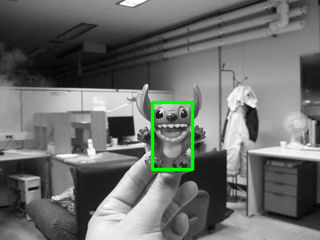

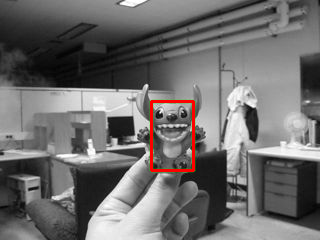

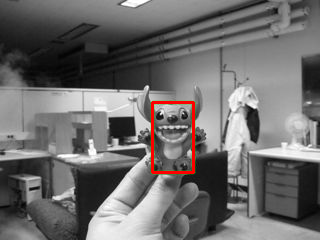

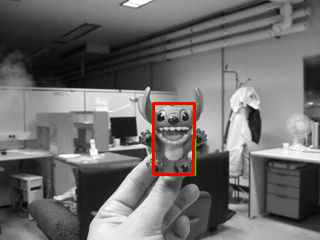

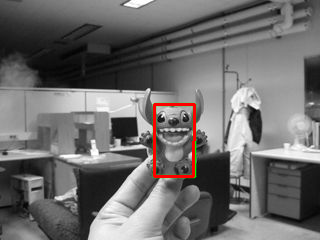

...

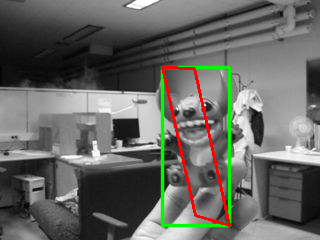

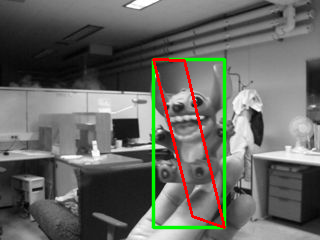

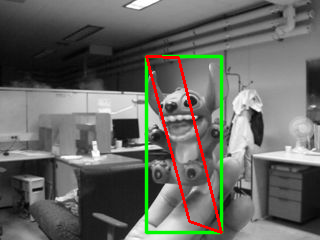

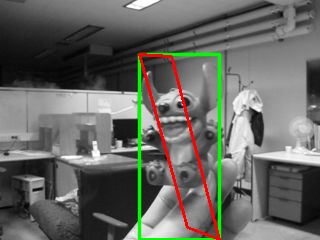

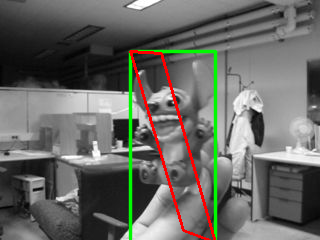

LinAlgError: ignored

In [183]:
import copy

frame = 1
frame_str = str(frame).zfill(4) 
#folder_path = './ClifBar/img/'
folder_path = './Toy/img/'
img_file = folder_path + frame_str + '.jpg'
template = cv2.imread(img_file, 0)
#height, width, _ = template.shape
#template = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)

roi = np.array([[152, 102], [192, 169]], np.int)   #toy
roi_points = rect_corners(roi)
#(140,	117) (175, 181)
#roi = np.array([[140,	117], [175, 181]], np.int) #clifBar

frame = 2

#fourcc = cv2.VideoWriter_fourcc(*'XVID')
#out = cv2.VideoWriter("track_Toy.avi", fourcc, 10.0, (width,height))

templ_out = cv2.cvtColor(template, cv2.COLOR_GRAY2BGR)
templ_out = cv2.rectangle(templ_out, tuple(roi[0]), tuple(roi[1]), (0,250, 0), 2, cv2.LINE_AA)
#templ_out = draw_rect(templ_out, roi_points)
cv2_imshow(templ_out)   

while frame < 40:
    img_file = folder_path + frame_str + '.jpg'
    image = cv2.imread(img_file,0)
    
    if image is None:
        print('No Image found')
        break


    roi_new, roi_points_new = lk_wrapper_v2(image, template, roi, roi_points)

    #templ_out = cv2.cvtColor(template, cv2.COLOR_GRAY2BGR)
    #templ_out = cv2.rectangle(templ_out, tuple(roi[0]), tuple(roi[1]), (0,250, 0), 2, cv2.LINE_AA)
    #templ_out = draw_rect(templ_out, roi_points)
    
    image_out = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)
    image_out = cv2.rectangle(image_out, tuple(roi_new[0]), tuple(roi_new[1]), (0,250, 0), 2, cv2.LINE_AA)
    image_out = draw_rect(image_out, roi_points_new)
    
    #cv2_imshow(templ_out)
    cv2_imshow(image_out)
    
    frame += 1
    frame_str = str(frame).zfill(4)
    
    
    roi = roi_new 
    roi_points = roi_points_new
    #roi_points = rect_corners(roi_new)
    template = image.copy()
    
    
    
    #print('frame----------------', frame)
    
    #out.write(image_out)
    
    
#out.release()    

In [ ]:
!wget

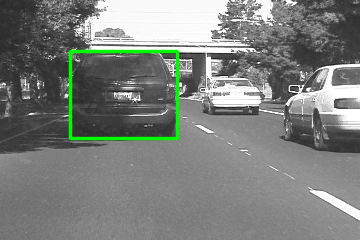

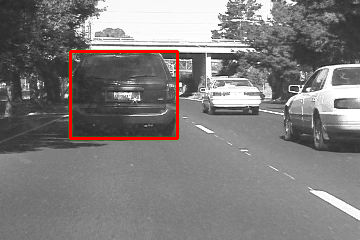

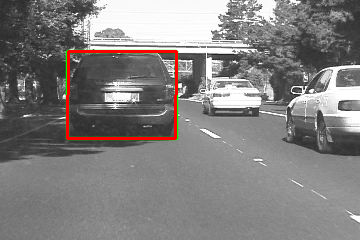

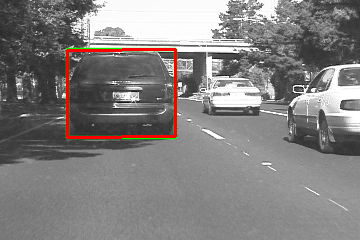

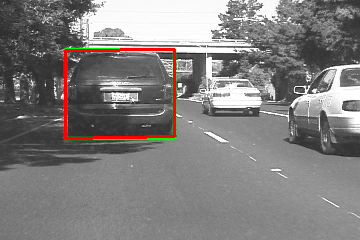

...

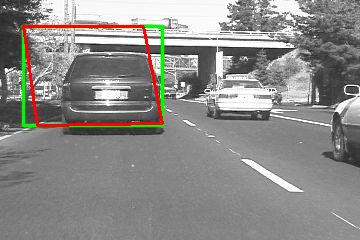

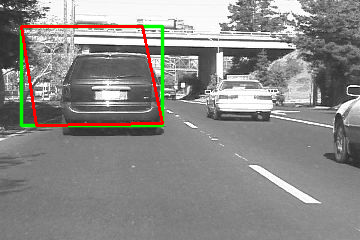

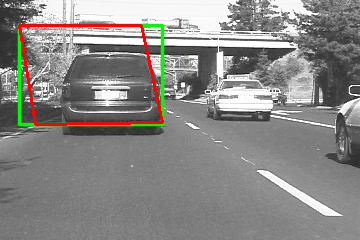

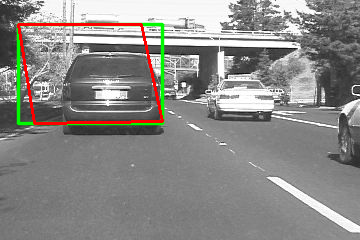

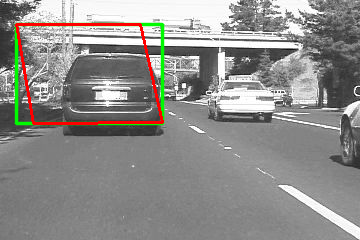

In [193]:
frame = 1
frame_str = str(frame).zfill(4) 
#folder_path = './ClifBar/img/'
#folder_path = './Toy/img/'
folder_path = './Car4/img/'
img_file = folder_path + frame_str + '.jpg'
template = cv2.imread(img_file, 0)
#height, width, _ = template.shape
#template = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)

#roi = np.array([[152, 102], [192, 169]], np.int)   #toy
#roi = np.array([[140,	117], [175, 181]], np.int) #clifBar
roi = np.array([[70,51], [177, 138]])  #Car
roi_points = rect_corners(roi)
#(140,	117) (175, 181)


frame = 2

#fourcc = cv2.VideoWriter_fourcc(*'XVID')
#out = cv2.VideoWriter("track_Toy.avi", fourcc, 10.0, (width,height))

templ_out = cv2.cvtColor(template, cv2.COLOR_GRAY2BGR)
templ_out = cv2.rectangle(templ_out, tuple(roi[0]), tuple(roi[1]), (0,250, 0), 2, cv2.LINE_AA)
#templ_out = draw_rect(templ_out, roi_points)
cv2_imshow(templ_out)   

while frame < 40:
    img_file = folder_path + frame_str + '.jpg'
    image = cv2.imread(img_file,0)
    
    if image is None:
        print('No Image found')
        break


    roi_new, roi_points_new = lk_wrapper(image, template, roi, roi_points)

    #templ_out = cv2.cvtColor(template, cv2.COLOR_GRAY2BGR)
    #templ_out = cv2.rectangle(templ_out, tuple(roi[0]), tuple(roi[1]), (0,250, 0), 2, cv2.LINE_AA)
    #templ_out = draw_rect(templ_out, roi_points)
    
    image_out = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)
    image_out = cv2.rectangle(image_out, tuple(roi_new[0]), tuple(roi_new[1]), (0,250, 0), 2, cv2.LINE_AA)
    image_out = draw_rect(image_out, roi_points_new)
    
    #cv2_imshow(templ_out)
    cv2_imshow(image_out)
    
    frame += 1
    frame_str = str(frame).zfill(4)
    
    
    roi = roi_new 
    roi_points = roi_points_new
    #roi_points = rect_corners(roi_new)
    template = image.copy()
    
    
    
    #print('frame----------------', frame)
    
    #out.write(image_out)
    
    
#out.release()

In [31]:
im = np.array([
               [2,2,2,2,2,2],
               [2,2,3,3,2,2],
               [2,2,3,3,2,2],
               [2,3,3,3,3,2],
               [2,2,3,3,3,2],
               [2,2,2,3,2,2]
], np.uint8)


prepared = n.reshape(36,2)
prepared = expand_with_ones(prepared)
wrp_mat = np.array([[2, 0, 0], 
                     [0, 1, 0]] )

new_coord = np.dot(wrp_mat, prepared.T)
#print(new_coord.shape)
new_coord = new_coord.T.reshape(6,6,2)
max_y = np.max(new_coord[:,:,1])
max_x = np.max(new_coord[:,:,0])
new_area = np.zeros((max_y+1, max_x+1))
print(new_area.shape)
for y in range (im.shape[0]):
  for x in range(im.shape[1]):
    #print(f"x,y {x,y}, nnew_coord[y,x] {new_coord[y,x]}")
    new_x = new_coord[y,x][0]
    new_y = new_coord[y,x][1]
    #print(new_y, new_x)
    new_area[new_y, new_x] =im[y,x]

new_area

(6, 11)


array([[2., 0., 2., 0., 2., 0., 2., 0., 2., 0., 2.],
       [2., 0., 2., 0., 3., 0., 3., 0., 2., 0., 2.],
       [2., 0., 2., 0., 3., 0., 3., 0., 2., 0., 2.],
       [2., 0., 3., 0., 3., 0., 3., 0., 3., 0., 2.],
       [2., 0., 2., 0., 3., 0., 3., 0., 3., 0., 2.],
       [2., 0., 2., 0., 2., 0., 3., 0., 2., 0., 2.]])

In [58]:
from scipy.interpolate import griddata

im = np.array([
               [2.0,2,2,2,2,2],
               [2,2,3,3,2,2],
               [2,2,3,3,2,2],
               [2,3,3,3,3,2],
               [2,2,3,3,3,2],
               [2,2,2,3,2,2]
], np.uint8)

ys = new_coord[:,:,1].reshape(-1)
xs = new_coord[:,:,0].reshape(-1)
points = np.vstack((ys, xs)).T
values = im.reshape(-1)

#print(f"points \n {points}")
#print(f"values \n {values}")


#grid_z0 = griddata(points, values, (grid_x, grid_y), method='nearest')
X, Y = np.meshgrid(range(max_x+1),range(max_y+1))

#print(f'X\n {X}')
#print(f'Y\n {Y}')

Ti = griddata((xs, ys), values, (X, Y), method='cubic')
#Ti
np.round(Ti)


array([[2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2.],
       [2., 2., 2., 2., 3., 3., 3., 2., 2., 2., 2.],
       [2., 2., 2., 3., 3., 3., 3., 2., 2., 2., 2.],
       [2., 3., 3., 3., 3., 3., 3., 3., 3., 2., 2.],
       [2., 2., 2., 3., 3., 3., 3., 3., 3., 3., 2.],
       [2., 2., 2., 2., 2., 3., 3., 3., 2., 2., 2.]])

roi
[[152 102]
 [192 169]]
clip_region
[[139  80]
 [205 191]]


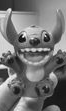

he, wi (111, 66)
start_x, start_y(139, 80)
clipped_img_new_rect 
[[-33 -55]
 [ 33  56]]
-63 -56 64 55


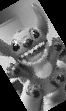

In [100]:
wrp_mat = cv2.getRotationMatrix2D	((0,0), 30, 1)
roi = np.array([[152, 102], [192, 169]], np.int)

templ_full_size = img1.copy()

# We need to downsize/crop the image in order to decrease computations for
# back warping and move reference point closer to original bounding box.
# This should simplify transformation, rotation in particular 
# (because it's hardly possible to rotate image with reference point 
# at the top left corner)
# We assume that tracked object didn't move further than 1/3 from original bounding box position
# so let's define new clipping region 1/3 larger than roi

clip_region = clipping_region(roi, templ_full_size.shape[0], templ_full_size.shape[1], 0.33)

clipped_img = crop(new_image_full_size, clip_region)

print(f"roi\n{roi}")
print(f"clip_region\n{clip_region}")
cv2_imshow(clipped_img)

he, wi = clipped_img.shape
print(f"he, wi {he, wi}")
start_x, start_y = clip_region[0][0], clip_region[0][1]
print(f"start_x, start_y{start_x, start_y}")
translated_roi = translate_cordinates(roi, start_x, start_y)
#translated_roi_corners =  rect_corners(translated_roi)
center_y, center_x = clipped_img.shape[0]//2, clipped_img.shape[1]//2
#img_range = -center_x, we-center_x
rct = np.array([[0,0], [wi, he]], np.int)
clipped_img_new_rect = translate_cordinates(rct, center_x, center_y)
#translated_roi2 = translate_cordinates(translated_roi, center_x, center_y)
print(f"clipped_img_new_rect \n{clipped_img_new_rect}")
x_arr = np.array(range(-center_x, wi-center_x ), np.int)
y_arr = np.array(range(-center_y, he-center_y ), np.int)

x, y = np.meshgrid(x_arr, y_arr) 
#ones = np.ones((6,6))
#m = np.stack((x, y, ones), axis = 2)
n =  np.stack((x, y), axis = 2)

prepared = n.reshape(he*wi,2)
prepared = expand_with_ones(prepared)

new_coord = np.dot(wrp_mat, prepared.T)
#print(new_coord.shape)
new_coord = new_coord.T.reshape(he,wi,2).astype(np.int)
min_y = np.min(new_coord[:,:,1])
min_x = np.min(new_coord[:,:,0])
max_y = np.max(new_coord[:,:,1])
max_x = np.max(new_coord[:,:,0])
new_area = np.zeros((max_y+1, max_x+1))
print(min_y, min_x, max_y, max_x)
#range_x = range(min_x, max_x+1)
#range_y = range(min_y, max_y+1)

range_x = range(clipped_img_new_rect[0,0],clipped_img_new_rect[1,0])
range_y = range(clipped_img_new_rect[0,1],clipped_img_new_rect[1,1])

#print(f"range_y, range_x {range_y, range_x}")

ys = new_coord[:,:,1].reshape(-1)
xs = new_coord[:,:,0].reshape(-1)
#points = np.vstack((ys, xs)).T
values = clipped_img.reshape(-1)
X, Y = np.meshgrid(range_x, range_y)
Ti = griddata((xs, ys), values, (X, Y), method='cubic')
res = np.round(Ti).astype(np.uint8)
res
cv2_imshow(res)



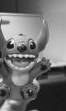

In [144]:
def customWarp(clipped_img, wrp_mat):
    clipped_img = clipped_img.copy()
    he, wi = clipped_img.shape    
    #print(f"he, wi {he, wi}")
    start_x, start_y = clip_region[0][0], clip_region[0][1]
    #print(f"start_x, start_y{start_x, start_y}")

    center_y, center_x = clipped_img.shape[0]//2, clipped_img.shape[1]//2
    rct = np.array([[0,0], [wi, he]], np.int)
    clipped_img_new_rect = translate_cordinates(rct, center_x, center_y)
    #print(f"clipped_img_new_rect \n{clipped_img_new_rect}")
    x_arr = np.array(range(-center_x, wi-center_x ), np.int)
    y_arr = np.array(range(-center_y, he-center_y ), np.int)
    
    x, y = np.meshgrid(x_arr, y_arr)
    n =  np.stack((x, y), axis = 2)
    
    prepared = n.reshape(he*wi,2)
    prepared = expand_with_ones(prepared)
    
    new_coord = np.dot(wrp_mat, prepared.T)
    #print(new_coord.shape)
    new_coord = new_coord.T.reshape(he,wi,2).astype(np.int)
    min_y = np.min(new_coord[:,:,1])
    min_x = np.min(new_coord[:,:,0])
    max_y = np.max(new_coord[:,:,1])
    max_x = np.max(new_coord[:,:,0])
    #new_area = np.zeros((max_y+1, max_x+1))
    #print(min_y, min_x, max_y, max_x)
    #range_x = range(min_x, max_x+1)
    #range_y = range(min_y, max_y+1)
    
    range_x = range(clipped_img_new_rect[0,0],clipped_img_new_rect[1,0])
    range_y = range(clipped_img_new_rect[0,1],clipped_img_new_rect[1,1])
    
    #print(f"range_y, range_x {range_y, range_x}")
    
    ys = new_coord[:,:,1].reshape(-1)
    xs = new_coord[:,:,0].reshape(-1)
    #points = np.vstack((ys, xs)).T
    values = clipped_img.reshape(-1)
    X, Y = np.meshgrid(range_x, range_y)
    Ti = griddata((xs, ys), values, (X, Y), method='cubic')
    #res = np.round(Ti).astype(np.uint8)
    return Ti
	

wrp_mat = cv2.getRotationMatrix2D	((0,0), 30, 1)

wrp_mat = [[1,0,0] ,[0,1,0]]
roi = np.array([[152, 102], [192, 169]], np.int)

templ_full_size = img1.copy()

clip_region = clipping_region(roi, templ_full_size.shape[0], templ_full_size.shape[1], 0.33)

clipped_img = crop(new_image_full_size, clip_region)

warped_img = np.round(customWarp(clipped_img, wrp_mat)).astype(np.uint8)

cv2_imshow(warped_img)



In [26]:
from scipy.ndimage.interpolation import affine_transform
#scipy.ndimage.interpolation.affine_transform(input, matrix, offset=0.0, output_shape=None, output=None, order=3, mode='constant', cval=0.0, prefilter=True)
wrp_mat = np.array([[2, 0, 0], 
                     [0, 2, 0],
                    [0,0,1]] )
im = np.array([
               [2,2,2,2,2,2],
               [2,2,3,3,2,2],
               [2,2,3,3,2,2],
               [2,3,3,3,3,2],
               [2,2,3,3,3,2],
               [2,2,2,3,2,2]
], np.uint8)
#im.shape

warped_img = affine_transform(im, wrp_mat, (2,2))
warped_img

array([[2, 2, 2, 0, 0, 0],
       [2, 3, 2, 0, 0, 0],
       [2, 3, 3, 0, 0, 0],
       [0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0]], dtype=uint8)

px shape (400,)
type(Ti)<class 'numpy.ndarray'>
Ti.shape(100, 100)


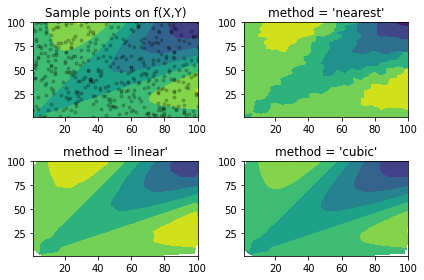

In [49]:
import numpy as np
from scipy.interpolate import griddata
import matplotlib.pyplot as plt

x = np.linspace(1,100,100)
y =  np.linspace(1,100,100)
X, Y = np.meshgrid(x,y)

def f(x, y):
    s = np.hypot(x, y)
    phi = np.arctan2(y, x)
    tau = s + s*(1-s)/5 * np.sin(6*phi) 
    return 5*(1-tau) + tau

T = f(X, Y)
# Choose npts random point from the discrete domain of our model function
npts = 400
px, py = np.random.choice(x, npts), np.random.choice(y, npts)
print(f"px shape {px.shape}")
fig, ax = plt.subplots(nrows=2, ncols=2)
# Plot the model function and the randomly selected sample points
ax[0,0].contourf(X, Y, T)
ax[0,0].scatter(px, py, c='k', alpha=0.2, marker='.')
ax[0,0].set_title('Sample points on f(X,Y)')

'''
print(f'px \n{px}')
print(f'py \n{py}')
print(f'X\n {X}')
print(f'Y\n {Y}')
'''
Ti = griddata((px, py), f(px,py), (X, Y), method='cubic')
print(f"type(Ti){type(Ti)}")
print(f"Ti.shape{Ti.shape}")

#print(f'Ti\n {Ti}')

r, c = (i+1) // 2, (i+1) % 2
ax[r,c].contourf(X, Y, Ti)
ax[r,c].set_title("method = '{}'".format(method))



# Interpolate using three different methods and plot
for i, method in enumerate(('nearest', 'linear', 'cubic')):
    Ti = griddata((px, py), f(px,py), (X, Y), method=method)
    r, c = (i+1) // 2, (i+1) % 2
    ax[r,c].contourf(X, Y, Ti)
    ax[r,c].set_title("method = '{}'".format(method))

plt.tight_layout()
plt.show()

In [184]:
!wget 'http://cvlab.hanyang.ac.kr/tracker_benchmark/seq/ClifBar.zip'
!unzip -oq ClifBar.zip

--2020-10-20 17:33:36--  http://cvlab.hanyang.ac.kr/tracker_benchmark/seq/ClifBar.zip
Resolving cvlab.hanyang.ac.kr (cvlab.hanyang.ac.kr)... 166.104.143.24
Connecting to cvlab.hanyang.ac.kr (cvlab.hanyang.ac.kr)|166.104.143.24|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 17185498 (16M) [application/zip]
Saving to: ‘ClifBar.zip’

ClifBar.zip         100%[===================>]  16.39M   845KB/s    in 28s     

2020-10-20 17:34:04 (608 KB/s) - ‘ClifBar.zip’ saved [17185498/17185498]



In [186]:
!wget 'http://cvlab.hanyang.ac.kr/tracker_benchmark/seq/Car4.zip'
!unzip -oq Car4.zip

--2020-10-20 17:39:18--  http://cvlab.hanyang.ac.kr/tracker_benchmark/seq/Car4.zip
Resolving cvlab.hanyang.ac.kr (cvlab.hanyang.ac.kr)... 166.104.143.24
Connecting to cvlab.hanyang.ac.kr (cvlab.hanyang.ac.kr)|166.104.143.24|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 15333109 (15M) [application/zip]
Saving to: ‘Car4.zip’

Car4.zip            100%[===================>]  14.62M   738KB/s    in 30s     

2020-10-20 17:39:49 (498 KB/s) - ‘Car4.zip’ saved [15333109/15333109]



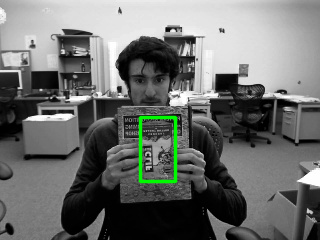

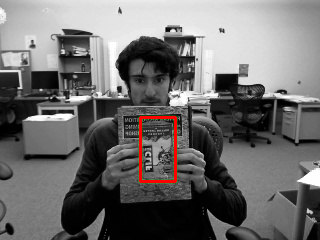

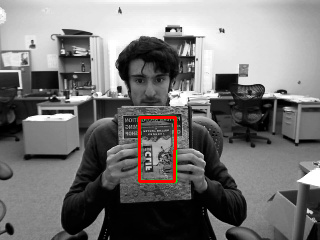

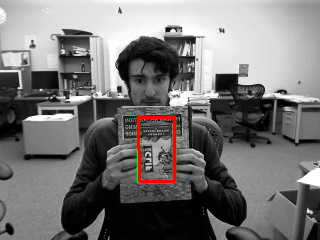

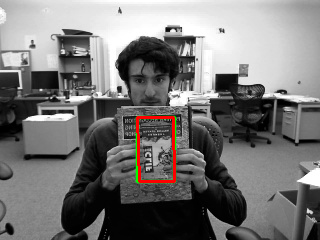

...

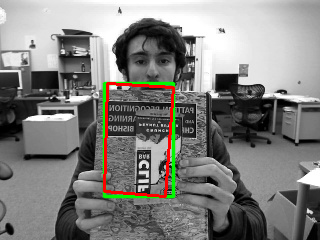

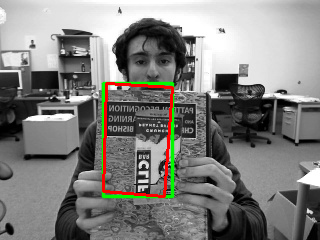

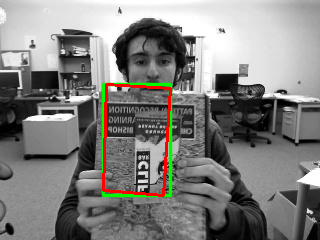

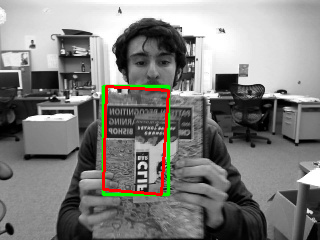

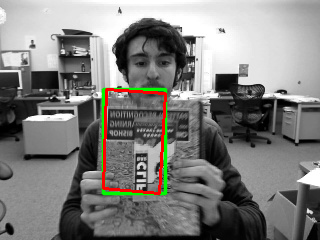

In [ ]:
frame = 1
frame_str = str(frame).zfill(4) 
#folder_path = './ClifBar/img/'
folder_path = './ClifBar/img/'
img_file = folder_path + frame_str + '.jpg'
template = cv2.imread(img_file, 0)
#height, width, _ = template.shape
#template = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)

#(140,	117) (175, 181)

roi = np.array([[140, 117], [175, 181]], np.int)   #clibar
roi_points = rect_corners(roi)
#(140,	117) (175, 181)
#roi = np.array([[140,	117], [175, 181]], np.int) #clifBar

frame = 2

#fourcc = cv2.VideoWriter_fourcc(*'XVID')
#out = cv2.VideoWriter("track_Toy.avi", fourcc, 10.0, (width,height))

templ_out = cv2.cvtColor(template, cv2.COLOR_GRAY2BGR)
templ_out = cv2.rectangle(templ_out, tuple(roi[0]), tuple(roi[1]), (0,250, 0), 2, cv2.LINE_AA)
#templ_out = draw_rect(templ_out, roi_points)
cv2_imshow(templ_out)   

while frame < 40:
    img_file = folder_path + frame_str + '.jpg'
    image = cv2.imread(img_file,0)
    
    if image is None:
        print('No Image found')
        break


    roi_new, roi_points_new = lk_wrapper(image, template, roi, roi_points)

    #templ_out = cv2.cvtColor(template, cv2.COLOR_GRAY2BGR)
    #templ_out = cv2.rectangle(templ_out, tuple(roi[0]), tuple(roi[1]), (0,250, 0), 2, cv2.LINE_AA)
    #templ_out = draw_rect(templ_out, roi_points)
    
    image_out = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)
    image_out = cv2.rectangle(image_out, tuple(roi_new[0]), tuple(roi_new[1]), (0,250, 0), 2, cv2.LINE_AA)
    image_out = draw_rect(image_out, roi_points_new)
    
    #cv2_imshow(templ_out)
    cv2_imshow(image_out)
    
    frame += 1
    frame_str = str(frame).zfill(4)
    
    
    roi = roi_new 
    roi_points = roi_points_new
    #roi_points = rect_corners(roi_new)
    template = image.copy()

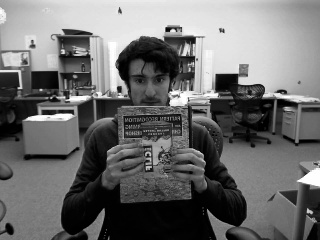

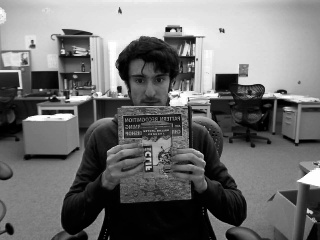

In [ ]:
img1_path = './ClifBar/img/0001.jpg'
img2_path = './ClifBar/img/0002.jpg'
#img1 = cv2.imread('./Toy/img/0001.jpg',0)
img1 = cv2.imread(img1_path,0)
img2 = cv2.imread(img2_path,0)
#cv2.imshow('image1',img1)
cv2_imshow(img1)
cv2_imshow(img2)

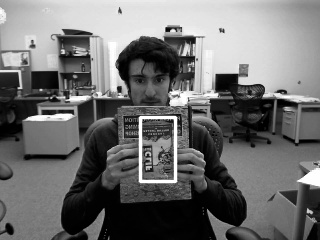

In [ ]:
img1_c = img1.copy()
img2_c = img2.copy()
img1_c = cv2.rectangle(img1_c, (140,	117), (140 + 35,	117 + 64), 255, 2, cv2.LINE_AA)

#140	117	39	64
cv2_imshow(img1_c)


In [1]:
list(reversed(range(3)))

[2, 1, 0]